# Task 1
 
1. Build a model that predicts churn on telephone customers based on the set of dependent variables found in the ‘train’ data set (found in the ‘Train’ tab). The last column indicates if they stopped their service (or “churned”).

2. Provide a summary of your model and any relevant metrics for accuracy/predictive power.

3. Please add a column to the “test” data set and predict whether you expect customer to churn (“yes” or “no”).
 # Import necessary libraries 
# Installing necessary updates

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.offline as po
import plotly.graph_objs as go 
import sklearn 
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split 
%matplotlib inline 

In [2]:
import pandas_profiling

import sys
!{sys.executable} -m pip install pandas-profiling

In [4]:
!pip install -U ipywidgets
import ipywidgets
ipywidgets.__version__

from ipywidgets import GridspecLayout, VBox, widgets

Requirement already up-to-date: ipywidgets in /home/jupyterlab/conda/envs/python/lib/python3.6/site-packages (7.6.3)


In [5]:
churn_df = pd.read_excel("Telecom_Data.xlsx")
churn_df.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [6]:
# Exploratory data analysis 

pandas_profiling.ProfileReport(pd.read_excel('Telecom_Data.xlsx'))

Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
churn_df.columns.values

array(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn'], dtype=object)

In [8]:
# Checking for null values 

churn_df.isna().sum()

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

In [9]:
churn_df.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000,3828.000000
mean,100.258621,7.601358,180.235554,100.040230,30.640564,199.917816,100.138454,16.993247,200.760972,99.894984,9.034386,10.260423,4.413532,2.770818,1.554075
std,39.630558,13.410502,54.054370,19.799992,9.189229,50.416136,19.897455,4.285384,50.533210,20.150646,2.274016,2.772895,2.466943,0.748669,1.306234
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,143.300000,87.000000,24.360000,165.700000,87.000000,14.080000,167.100000,86.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,100.000000,0.000000,180.500000,100.000000,30.690000,200.600000,100.000000,17.050000,200.800000,100.000000,9.040000,10.400000,4.000000,2.810000,1.000000
75%,127.000000,16.000000,216.700000,113.000000,36.840000,233.500000,114.000000,19.850000,235.000000,114.000000,10.580000,12.100000,6.000000,3.270000,2.000000
max,243.000000,52.000000,351.500000,165.000000,59.760000,359.300000,170.000000,30.540000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [10]:
churn_df['churn'].value_counts()

no     3295
yes     533
Name: churn, dtype: int64

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='churn', ylabel='count'>

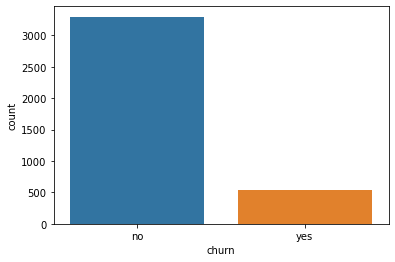

In [11]:
#visualize count of churn 

sns.countplot(churn_df['churn'])

In [12]:
# Conver all non-numerica columns to numeric

for column in churn_df.columns:
    if churn_df[column].dtype == np.number:
        continue 
    churn_df[column] = LabelEncoder().fit_transform(churn_df[column])

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning:

Converting `np.inexact` or `np.floating` to a dtype is deprecated. The current result is `float64` which is not strictly correct.



In [13]:
# New data types 
churn_df.dtypes

state                              int64
account_length                     int64
area_code                          int64
international_plan                 int64
voice_mail_plan                    int64
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                              int64
dtype: object

In [14]:
churn_df.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,35,106,1,0,1,20,161.6,84,27.47,195.5,63,16.62,254.4,65,11.45,13.7,3,3.70,1,0
1,31,136,1,0,0,0,243.4,75,41.38,121.2,70,10.30,162.6,66,7.32,12.2,5,3.29,0,0
2,35,83,0,1,0,0,299.4,32,50.90,61.9,48,5.26,196.9,51,8.86,6.6,7,1.78,2,0
3,36,74,1,1,0,0,166.7,74,28.34,148.3,82,12.61,186.9,83,8.41,10.1,3,2.73,3,0
4,19,120,2,0,1,18,218.2,49,37.09,348.5,68,29.62,212.6,80,9.57,7.5,7,2.03,3,0


In [15]:
# Creating feature variable X
X = np.asarray(churn_df[['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls']])
X[0:5]

array([[ 35.  , 106.  ,   1.  ,   0.  ,   1.  ,  20.  , 161.6 ,  84.  ,
         27.47, 195.5 ,  63.  ,  16.62, 254.4 ,  65.  ,  11.45,  13.7 ,
          3.  ,   3.7 ,   1.  ],
       [ 31.  , 136.  ,   1.  ,   0.  ,   0.  ,   0.  , 243.4 ,  75.  ,
         41.38, 121.2 ,  70.  ,  10.3 , 162.6 ,  66.  ,   7.32,  12.2 ,
          5.  ,   3.29,   0.  ],
       [ 35.  ,  83.  ,   0.  ,   1.  ,   0.  ,   0.  , 299.4 ,  32.  ,
         50.9 ,  61.9 ,  48.  ,   5.26, 196.9 ,  51.  ,   8.86,   6.6 ,
          7.  ,   1.78,   2.  ],
       [ 36.  ,  74.  ,   1.  ,   1.  ,   0.  ,   0.  , 166.7 ,  74.  ,
         28.34, 148.3 ,  82.  ,  12.61, 186.9 ,  83.  ,   8.41,  10.1 ,
          3.  ,   2.73,   3.  ],
       [ 19.  , 120.  ,   2.  ,   0.  ,   1.  ,  18.  , 218.2 ,  49.  ,
         37.09, 348.5 ,  68.  ,  29.62, 212.6 ,  80.  ,   9.57,   7.5 ,
          7.  ,   2.03,   3.  ]])

In [16]:
# Creating target variable y

y = np.asarray(churn_df['churn'])
y [0:5]

array([0, 0, 0, 0, 0])

In [17]:
#Normalizing dataset

X = StandardScaler().fit(X).transform(X)
X[0:5]

array([[ 0.611222  ,  0.17221059,  0.01247745, -0.32366944,  1.68394517,
         1.27844766, -0.34480077,  1.1656659 , -0.34507556, -0.08763848,
         0.14382997, -0.08710909,  1.0615996 ,  0.15408317,  1.06240678,
         1.24059023, -0.57306422,  1.24127412, -0.4242331 ],
       [ 0.34047154,  0.9323837 ,  0.01247745, -0.32366944, -0.59384356,
        -0.55296378,  1.16868809,  0.70871574,  1.16885088, -1.56156554,
         0.49760894, -1.56208209, -0.75526485,  0.20392098, -0.75400105,
         0.69956863,  0.23776181,  0.6935642 , -1.18989284],
       [ 0.611222  , -0.4105888 , -1.3923368 ,  3.0895719 , -0.59384356,
        -0.55296378,  2.20481739, -1.47449057,  2.2049817 , -2.73792994,
        -0.6142678 , -2.73832639, -0.07641462, -0.54364606, -0.07669644,
        -1.32024534,  1.04858784, -1.32361138,  0.34142664],
       [ 0.67890962, -0.63864074,  0.01247745,  3.0895719 , -0.59384356,
        -0.55296378, -0.250439  ,  0.6579435 , -0.25038714, -1.02396899,
         1.104

In [18]:
# Split into test (20%) and training (80%) sets

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (3062, 19) (3062,)
Test set: (766, 19) (766,)


In [19]:
# Building and fitting the LR model 
LR_model = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)
LR_model 

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

In [20]:
# Predicting values for new data 

predictions = LR_model.predict(X_test)
print(predictions)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 

In [21]:
#Probability estimates for all classes 

yhat_prob = LR_model.predict_proba(X_test)
yhat_prob

array([[0.96072071, 0.03927929],
       [0.9076977 , 0.0923023 ],
       [0.8706973 , 0.1293027 ],
       ...,
       [0.63760905, 0.36239095],
       [0.88240019, 0.11759981],
       [0.71169261, 0.28830739]])

In [26]:
yhat = LR_model.predict(X_test)
yhat

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

### Checking Accuracy of Model using several methods 

In [27]:
# Machine Learning classification model libraries
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

In [28]:
# Checking precision, recall, and f1_score
print(classification_report(y_test, predictions))


              precision    recall  f1-score   support

           0       0.88      0.99      0.93       658
           1       0.65      0.16      0.25       108

   micro avg       0.87      0.87      0.87       766
   macro avg       0.77      0.57      0.59       766
weighted avg       0.85      0.87      0.83       766



In [29]:
#Using jaccard index for accuracy evaluation

from sklearn.metrics import jaccard_similarity_score
jaccard_similarity_score(y_test, yhat)

0.8694516971279374

In [30]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
print(confusion_matrix(y_test, yhat, labels=[1,0]))

[[ 17  91]
 [  9 649]]


Confusion matrix, without normalization
[[ 17  91]
 [  9 649]]


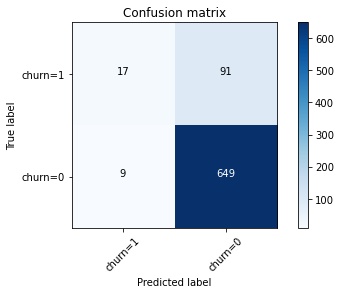

In [31]:
# Computing confusion matrix
cnf_matrix = confusion_matrix(y_test, yhat, labels=[1,0])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['churn=1','churn=0'],normalize= False,  title='Confusion matrix')

In [32]:
# Find Accuracy using accuracy_score method
logmodel_accuracy = round(metrics.accuracy_score(y_test, predictions) * 100, 2)

In [33]:
#Fit the Support Vector Machine Model
svcmodel = SVC(kernel='linear', random_state=50, probability=True)
svcmodel.fit(X_train,y_train)

#Predict the value for new, unseen data
svc_pred = svcmodel.predict(X_test)

# Find Accuracy using accuracy_score method
svc_accuracy = round(metrics.accuracy_score(y_test, svc_pred) * 100, 2)

In [34]:
#Fit the K-Nearest Neighbor Model
from sklearn.neighbors import KNeighborsClassifier
knnmodel = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2) #p=2 represents Euclidean distance, p=1 represents Manhattan Distance
knnmodel.fit(X_train, y_train) 
  
#Predict the value for new, unseen data
knn_pred = knnmodel.predict(X_test)

# Find Accuracy using accuracy_score method
knn_accuracy = round(metrics.accuracy_score(y_test, knn_pred) * 100, 2)

In [35]:
#Fit the Decision Tree Classification Model
from sklearn.tree import DecisionTreeClassifier
dtmodel = DecisionTreeClassifier(criterion = "gini", random_state = 50)
dtmodel.fit(X_train, y_train) 
  
#Predict the value for new, unseen data
dt_pred = dtmodel.predict(X_test)

# Find Accuracy using accuracy_score method
dt_accuracy = round(metrics.accuracy_score(y_test, dt_pred) * 100, 2)

In [36]:
#Fit the Random Forest Classification Model
from sklearn.ensemble import RandomForestClassifier
rfmodel = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfmodel.fit(X_train, y_train) 
  
#Predict the value for new, unseen data
rf_pred = rfmodel.predict(X_test)

# Find Accuracy using accuracy_score method
rf_accuracy = round(metrics.accuracy_score(y_test, rf_pred) * 100, 2)

In [37]:
# Compare Several models according to their accuracies
Model_Comparison = pd.DataFrame({
    'Model': ['Logistic Regression', 'Support Vector Machine', 'K-Nearest Neighbor', 
              'Decision Tree', 'Random Forest'],
    'Score': [logmodel_accuracy, svc_accuracy, knn_accuracy, 
              dt_accuracy, rf_accuracy]})
Model_Comparison_df = Model_Comparison.sort_values(by='Score', ascending=False)
Model_Comparison_df = Model_Comparison_df.set_index('Score')
Model_Comparison_df.reset_index()

,Score,Model
0,96.08,Random Forest
1,93.34,Decision Tree
2,89.95,K-Nearest Neighbor
3,86.95,Logistic Regression
4,85.90,Support Vector Machine


In [38]:
# Create a Dataframe showing probability of Churn based on state 
churn_df[['state','churn']].head(10)

,state,churn
0,35,0
1,31,0
2,35,0
3,36,0
4,19,0
5,24,0
6,18,0
7,49,0
8,15,1
9,12,0


# Saving model to use on test set

In [39]:
# Save Model Using Pickle
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
import pickle

# save the model to disk
filename = 'churn_finalized_model.sav'
pickle.dump(LR_model, open(filename, 'wb'))

In [41]:
load_model = pickle.load(open('churn_finalized_model.sav', 'rb'))
result = load_model.score(X_test, y_test)
print(result)

0.8694516971279374
